<a href="https://colab.research.google.com/github/Jeremy26/visual_fusion_course/blob/main/Visual_Fusion_Late_Starter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
! git clone https://github.com/Vishalkagade/Camera-Lidar-Sensor-Fusion.git

Cloning into 'Camera-Lidar-Sensor-Fusion'...
remote: Enumerating objects: 77, done.
remote: Counting objects: 100% (77/77), done.
remote: Compressing objects: 100% (66/66), done.
remote: Total 77 (delta 16), reused 65 (delta 9), pack-reused 0
Unpacking objects: 100% (77/77), 27.83 MiB | 10.84 MiB/s, done.


In [2]:
!pip install -r /kaggle/working/Camera-Lidar-Sensor-Fusion/requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.6/40.6 kB 1.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.7/399.7 MB 3.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.0/755.0 kB 20.2 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 72.7 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 215.0/215.0 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 45.2 MB/s eta 0:00:00:00:01
  Created wheel for statistics: filename=statistics-1.0.3.5-py3-none-any.whl size=7436 sha256=0d830ea736522f5ebd8c864a28d08e4e9c0a7484152cc7e468cf0fe2b56ed8ce
  Stored in directory: /root/.cache/pip/wheels/59/bd/aa/41ad56fbb723d36e457b5be74feb992cdac2855a6999ba34a1
Successfully built statistics
  Attempting uninstall: widgetsnbextension
    Found existing installation

##0 - Load the Data and Visualize it!

### Import the necessary libraries

In [3]:
!pip install open3d

In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import Image
import glob
import open3d as o3d
import pandas as pd

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


### Load the Files




In [5]:
image_files = sorted(glob.glob("/kaggle/working/Camera-Lidar-Sensor-Fusion/data/img/*.png"))
point_files = sorted(glob.glob("/kaggle/working/Camera-Lidar-Sensor-Fusion/data/velodyne/*.pcd"))
label_files = sorted(glob.glob("/kaggle/working/Camera-Lidar-Sensor-Fusion/data/label/*.txt"))
calib_files = sorted(glob.glob("/kaggle/working/Camera-Lidar-Sensor-Fusion/data/calib/*.txt"))
print("There are",len(image_files),"images")
index = 3
image = cv2.cvtColor(cv2.imread(image_files[index]), cv2.COLOR_BGR2RGB)
pcd_file = point_files[index]
cloud = o3d.io.read_point_cloud(pcd_file)
points= np.asarray(cloud.points)

There are 5 images


### Visualize the Image

Text(0.5, 1.0, 'Image')

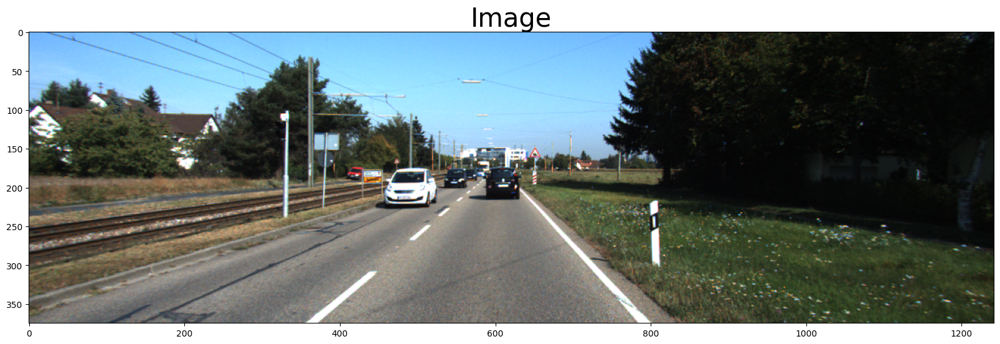

In [6]:
f, (ax1) = plt.subplots(1, 1, figsize=(20,10))
ax1.imshow(image)
ax1.set_title('Image', fontsize=30)

### Visualize the Point Clouds

In [7]:
!pip install pypotree #https://github.com/centreborelli/pypotree

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.7/147.7 kB 3.4 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for pypotree: filename=pypotree-1.0.5-py3-none-any.whl size=10295661 sha256=93b1ad3f4f637bce0d730d870cc2213b379e193d0f0721ae886644334d96d068
  Stored in directory: /root/.cache/pip/wheels/61/53/c5/9fa90014fa2b468849fcebd5b3bb71f8eda71229e9953a6c5b
Successfully built pypotree


In [8]:
!pip install portpicker

In [9]:
import pypotree
cloudpath = pypotree.generate_cloud_for_display(points)
pypotree.display_cloud_colab(cloudpath)

/opt/conda/lib/python3.10/site-packages/bin/PotreeConverter .tmp.txt -f xyz -o point_clouds -p d6a19f --material ELEVATION --edl-enabled --overwrite
== params ==
source[0]:         	.tmp.txt
outdir:            	point_clouds
spacing:           	0
diagonal-fraction: 	200
levels:            	-1
format:            	xyz
scale:             	0
pageName:          	d6a19f
projection:        	

AABB: 
min: [-78.925, -79.676, -26.165]
max: [78.458, 78.887, 2.884]
size: [157.383, 158.563, 29.049]

cubic AABB: 
min: [-78.925, -79.676, -26.165]
max: [79.638, 78.887, 132.398]
size: [158.563, 158.563, 158.563]

spacing calculated from diagonal: 1.3732
READING:  .tmp.txt
closing writer

conversion finished
119620 points were processed and 119620 points ( 100% ) were written to the output. 
duration: 1.226s
server on port 34089: thread <Thread(Thread-6 (server_entry), started 134625673963264)> 
https://localhost:34089/point_clouds/pointclouds/d6a19f


### 1.1. Copy/Paste the function to use YOLO

In [10]:
# !python3 -m pip install yolov4==2.0.2 # After Checking, YOLO 2.0.2 works without modifying anything. Otherwise keep 1.2.1

In [11]:
from ultralytics import YOLO
import time
model = YOLO('yolov8s.pt')
def run_obstacle_detection(img):
    start_time=time.time()
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    predictions = model(img ,conf = 0.5,classes = [1,2,7])
    for r in predictions:
        pred_bboxes = (r.boxes.data).detach().cpu().numpy()
        result = r.plot()
    return result,pred_bboxes


100%|██████████| 21.5M/21.5M [00:00<00:00, 189MB/s]



0: 224x640 3 cars, 363.1ms
Speed: 10.0ms preprocess, 363.1ms inference, 3681.6ms postprocess per image at shape (1, 3, 224, 640)


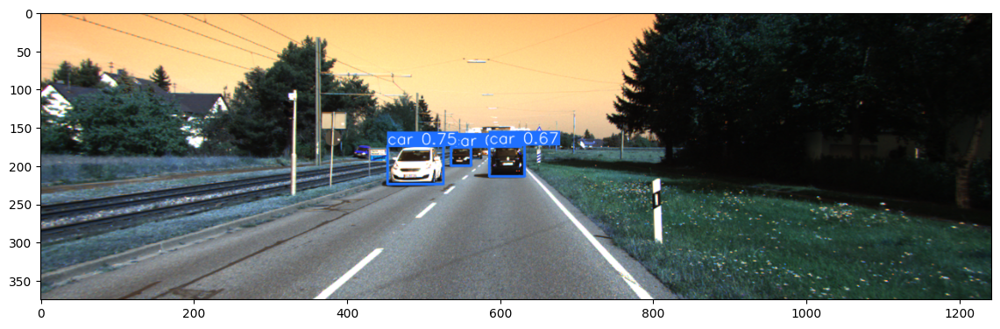

In [12]:
result, pred_bboxes = run_obstacle_detection(image)
fig_camera = plt.figure(figsize=(14, 7))
ax_lidar = fig_camera.subplots()
ax_lidar.imshow(result)
plt.show()

In [13]:
from os import XATTR_SIZE_MAX
class Object2D(object):
    def __init__(self, box2D, w, h):
        xmin, ymin, xmax, ymax, confidence, class_id = box2D
        self.xmin = xmin
        self.ymin = ymin # center_y - height/2
        self.xmax = xmax # center_x + width/2
        self.ymax = ymax # center_y + height/2
        self.bbox = np.array([self.xmin, self.ymin, self.xmax, self.ymax])
        self.category = class_id
        self.confidence = confidence

def fill_2D_obstacles(result, pred_bboxes):
    return [Object2D(box, result.shape[1], result.shape[0]) for box in pred_bboxes]

In [14]:
list_of_2d_objects = fill_2D_obstacles(result, pred_bboxes)

In [15]:
def read_label(label_filename):
    lines = [line.rstrip() for line in open(label_filename)]
    objects = [Object3d(line) for line in lines if line.split(" ")[0]!="DontCare"]
    return objects

--- TODO --- Build the Object3D Class

In [16]:
class Object3d(object):
    """ 3d object label """
    def __init__(self, label_file_line):
        data = label_file_line.split(" ")
        data[1:] = [float(x) for x in data[1:]]

        # extract 3d bounding box information
        self.h = data[8]  # box height
        self.w = data[9]  # box width
        self.l = data[10]  # box length (in meters)
        self.t = (data[11], data[12], data[13])  # location (x,y,z) in camera coord.
        self.ry = data[14]  # yaw angle (around Y-axis in camera coordinates) [-pi..pi]

        self.xmin = 0
        self.xmax = 0
        self.ymin = 0
        self.ymax = 0
        self.bbox2d = np.zeros(shape=(2,2))
        self.bbox3d = np.zeros(shape=(4,2))

In [17]:
list_of_3d_objects = read_label(label_files[index])
for obj3d in list_of_3d_objects:
    print("Object Lateral Position (X), Height(Y), Distance (Z) :"+ str(obj3d.t))

Object Lateral Position (X), Height(Y), Distance (Z) :(-3.79, 1.72, 23.79)
Object Lateral Position (X), Height(Y), Distance (Z) :(-3.68, 1.79, 44.92)
Object Lateral Position (X), Height(Y), Distance (Z) :(-3.85, 1.79, 68.42)
Object Lateral Position (X), Height(Y), Distance (Z) :(0.02, 1.64, 29.39)


Again, I invite you to take my course [Point Clouds Fast Course: Introduction to 3D Perception](https://courses.thinkautonomous.ai/point-clouds) to learn more about the 3D Perception process.

### 3.1 - Create a LiDAR2Camera object and fill it with the P value from the camera calibration

In [18]:
class LiDAR2Camera(object):
    def __init__(self, calib_file):
        self.P = np.reshape(self.read_calib_file(calib_file)["P2"], [3,4])

    def read_calib_file(self, filepath):
        """ Read in a calibration file and parse into a dictionary.
        Ref: https://github.com/utiasSTARS/pykitti/blob/master/pykitti/utils.py
        """
        data = {}
        with open(filepath, "r") as f:
            for line in f.readlines():
                line = line.rstrip()
                if len(line) == 0:
                    continue
                key, value = line.split(":", 1)
                # The only non-float values in these files are dates, which
                # we don't care about anyway
                try:
                    data[key] = np.array([float(x) for x in value.split()])
                except ValueError:
                    pass
        return data

### 3.2 - Create a function to project 3D points in 2D

In Early Fusion, we were doing the conversion from the LiDAR to the camera, and then from the camera to the image. *Here, you already have the first step implemented*; so you only need to deal with the conversion **from the camera to the image**.

1.   Convert to Homogeneous Coordinates
2.   Multiply it with P
3.   Divide it with the last element and convert it back to the cartesian coordinates



-- TODO -- Build a function that projects a point to an image

In [19]:
def project_to_image(self, pts_3d):
    """ Project 3d points to image plane.
    """
    # Convert to Homogeneous Coordinates
    n = pts_3d.shape[0]
    pts_3d_extend = np.hstack((pts_3d, np.ones((n, 1))))
    # Multiply with the P Matrix
    pts_2d = np.dot(pts_3d_extend, np.transpose(self.P))  # nx3
    # Convert Back to Cartesian
    pts_2d[:, 0] /= pts_2d[:, 2]
    pts_2d[:, 1] /= pts_2d[:, 2]
    return pts_2d[:, 0:2]

LiDAR2Camera.project_to_image = project_to_image

### 3.3 - Compute the 3D Bounding Box from the Values

Create a function that, given a 3D Object (X,Y,Z, W,H,L, RY), outputs a 3D Bounding Box (in the camera frame)

--- TODO -- Code a function that builds a 3D Bounding Box

In [20]:
def roty(t):
    """ Rotation about the y-axis. """
    c = np.cos(t)
    s = np.sin(t)
    return np.array([[c, 0, s], [0, 1, 0], [-s, 0, c]])

def compute_box_3d(self,obj):
        """ Projects the 3d bounding box into the image plane.
            Returns:
                corners_2d: (8,2) array in left image coord.
                corners_3d: (8,3) array in in rect camera coord.
        """
        # compute rotational matrix around yaw axis
        R = roty(obj.ry)
        # 3d bounding box dimensions
        l = obj.l
        w = obj.w
        h = obj.h

        # 3d bounding box corners
        x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2]
        y_corners = [0, 0, 0, 0, -h, -h, -h, -h]
        z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2]

        # rotate and translate 3d bounding box
        #corners_3d = np.vstack([x_corners, y_corners, z_corners])
        corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
        corners_3d[0, :] = corners_3d[0, :] + obj.t[0]
        corners_3d[1, :] = corners_3d[1, :] + obj.t[1]
        corners_3d[2, :] = corners_3d[2, :] + obj.t[2]

        # only draw 3d bounding box for objs in front of the camera
        if np.any(corners_3d[2, :] < 0.1):
            corners_2d = None
            return corners_2d

        # project the 3d bounding box into the image plane
        corners_2d = self.project_to_image(np.transpose(corners_3d))

        return corners_2d


LiDAR2Camera.compute_box_3d = compute_box_3d

### 3.4 - Create a function to draw a bounding box in 3D, and another one to draw that same bounding box in 2D

In [21]:
def draw_projected_box3d(self,image, qs, color=(255, 0, 0), thickness=2):
        """ Draw 3d bounding box in image
            qs: (8,3) array of vertices for the 3d box in following order:
                1 -------- 0
            /|         /|
            2 -------- 3 .
            | |        | |
            . 5 -------- 4
            |/         |/
            6 -------- 7
        """
        qs = qs.astype(np.int32)
        for k in range(0, 4):
            # Ref: http://docs.enthought.com/mayavi/mayavi/auto/mlab_helper_functions.html
            i, j = k, (k + 1) % 4
            # use LINE_AA for opencv3
            # cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness, cv2.CV_AA)
            cv2.line(image, (qs[i, 0], qs[i, 1]), (qs[j, 0], qs[j, 1]), color, thickness)
            i, j = k + 4, (k + 1) % 4 + 4
            cv2.line(image, (qs[i, 0], qs[i, 1]), (qs[j, 0], qs[j, 1]), color, thickness)
            i, j = k, k + 4
            cv2.line(image, (qs[i, 0], qs[i, 1]), (qs[j, 0], qs[j, 1]), color, thickness)
        return image

LiDAR2Camera.draw_projected_box3d = draw_projected_box3d

-- TODO -- Code a function that projects a 3D Box into a 2D one

In [22]:
def project_8p_to_4p(self, pts_2d):
    x0 = np.min(pts_2d[:, 0])
    x1 = np.max(pts_2d[:, 0])
    y0 = np.min(pts_2d[:, 1])
    y1 = np.max(pts_2d[:, 1])
    x0 = max(0, x0)
    # x1 = min(x1, proj.image_width)
    y0 = max(0, y0)
    # y1 = min(y1, proj.image_height)
    return np.array([x0, y0, x1, y1])

LiDAR2Camera.project_8p_to_4p = project_8p_to_4p


In [23]:
def draw_projected_box2d(self, image, qs, color=(255,0,0), thickness=2):
    return cv2.rectangle(image, (int(qs[0]), int(qs[1])), (int(qs[2]), int(qs[3])), (255,0,0),2)

LiDAR2Camera.draw_projected_box2d = draw_projected_box2d

### 3.5 - Apply the full process and Draw the Box for Visualization

In [24]:
def get_image_with_bboxes(self,img, objects):
    img2 = np.copy(img)
    img3 = np.copy(img)
    for obj in objects:
        boxes = self.compute_box_3d(obj)
        if boxes is not None:
            obj.bbox3d = boxes
            obj.bbox2d = self.project_8p_to_4p(boxes)
            img2 = self.draw_projected_box2d(img2, obj.bbox2d) # Draw the 2D Bounding Box
            img3 = self.draw_projected_box3d(img3, obj.bbox3d) # Draw the 3D Bounding Box
    return img2, img3

LiDAR2Camera.get_image_with_bboxes=get_image_with_bboxes

Text(0.5, 1.0, 'Image with 3D Bounding Boxes from LiDAR')

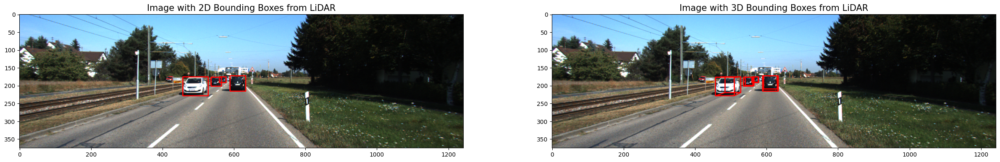

In [25]:
lidar2cam = LiDAR2Camera(calib_files[index])
lidar_2d, lidar_3d =lidar2cam.get_image_with_bboxes(image, list_of_3d_objects)

f,(ax1, ax2)= plt.subplots(1,2, figsize=(30,20))
ax1.imshow(lidar_2d)
ax1.set_title('Image with 2D Bounding Boxes from LiDAR', fontsize=15)
ax2.imshow(lidar_3d)
ax2.set_title('Image with 3D Bounding Boxes from LiDAR', fontsize=15)


### 4.1 - Show both lidar and camera boxes

In [26]:
import cv2
import numpy as np
from PIL import Image

def draw_boxes_cv(img2, detections):
    # Open the image only if it's a path
    img = np.copy(img2)
    if isinstance(img, str):
        img = cv2.imread(img)
    # Convert PIL Image to numpy array if necessary
    elif isinstance(img, Image.Image):
        img = np.array(img)

    # Assuming class 2 is 'car'
    class_labels = {2: 'car'}

    # Loop through detections and draw each as a rectangle
    for detection in detections:
        x1, y1, x2, y2, confidence, class_id = detection
        # Draw rectangle
        cv2.rectangle(img, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)

        # Prepare text for class label and confidence
        label = f"{class_labels.get(class_id, str(class_id))}: {confidence:.2f}"
        # Calculate text width & height to draw the transparent boxes as background
        (w, h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 1)

        # Draw background rectangle for text
        cv2.rectangle(img, (int(x1), int(y1) - 20), (int(x1) + w, int(y1) - 20 + h), (0, 255, 0), -1)
        # Put text above rectangle
        cv2.putText(img, label, (int(x1), int(y1) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 1)

    # Convert back to PIL Image before returning, if needed
    img_pil = Image.fromarray(img)
    return img_pil

    #plt.axis('off')  # Hide the axis
   # plt.show()


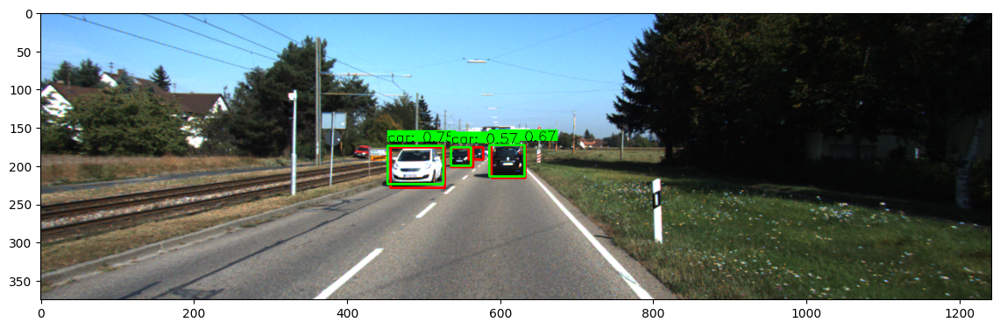

In [27]:
res = draw_boxes_cv(lidar_2d, pred_bboxes)

fig_fusion = plt.figure(figsize=(14, 7))
ax_fusion = fig_fusion.subplots()
ax_fusion.imshow(res)
plt.show()

### 4.2 - Compute the IOU Metrics for every box

In [28]:
def box_iou(box1, box2):
    """
    Computer Intersection Over Union cost
    """
    xA = max(box1[0], box2[0])
    yA = max(box1[1], box2[1])
    xB = min(box1[2], box2[2])
    yB = min(box1[3], box2[3])

    inter_area = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    # Calculate the Union area by using Formula: Union(A,B) = A + B - Inter(A,B)
    box1_area = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1) #abs((box1[3] - box1[1])*(box1[2]- box1[0]))
    box2_area = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1) #abs((box2[3] - box2[1])*(box2[2]- box2[0]))
    union_area = (box1_area + box2_area) - inter_area

    # compute the IoU
    iou = inter_area/float(union_area)
    return iou

### 4.3 - Send the IOU Matrix to the Hungarian Algorithm that outputs the mathes

--- TODO -- Create the function to associate two bounding boxes

Optional: Also return the boxes that don't match on each sensor

In [29]:
from scipy.optimize import linear_sum_assignment

def associate(lidar_boxes, camera_boxes):
    """
    LiDAR boxes will represent the red bounding boxes
    Camera will represent the other bounding boxes
    Function goal: Define a Hungarian Matrix with IOU as a metric and return, for each box, an id
    """
    # Define a new IOU Matrix nxm with old and new boxes
    iou_matrix = np.zeros((len(lidar_boxes),len(camera_boxes)),dtype=np.float32)

    # Go through boxes and store the IOU value for each box
    # You can also use the more challenging cost but still use IOU as a reference for convenience (use as a filter only)
    for i,lidar_box in enumerate(lidar_boxes):
        for j,camera_box in enumerate(camera_boxes):
            iou_matrix[i][j] = box_iou(lidar_box, camera_box)

    # Call for the Hungarian Algorithm
    hungarian_row, hungarian_col = linear_sum_assignment(-iou_matrix)
    hungarian_matrix = np.array(list(zip(hungarian_row, hungarian_col)))

    # Create new unmatched lists for old and new boxes
    matches, unmatched_camera_boxes, unmatched_lidar_boxes = [], [], []

    # Go through the Hungarian Matrix, if matched element has IOU < threshold (0.3), add it to the unmatched
    # Else: add the match
    for h in hungarian_matrix:
        if(iou_matrix[h[0],h[1]]>0.4):
            matches.append(h.reshape(1,2))

    if(len(matches)==0):
        matches = np.empty((0,2),dtype=int)
    else:
        matches = np.concatenate(matches,axis=0)

    return matches,iou_matrix


In [30]:
lidar_boxes = [obs.bbox2d for obs in list_of_3d_objects] # Simply get the boxes
camera_boxes = [obs.bbox for obs in list_of_2d_objects]

matches,iou_matrix = associate(lidar_boxes, camera_boxes)

print(matches)
print(iou_matrix)

[[0 0]
 [1 2]
 [3 1]]
[[    0.79809           0           0]
 [          0           0      0.7723]
 [          0           0    0.060661]
 [          0     0.87751           0]]


## 5 - Create an ultimate Fused Object with all the values

In [31]:
class FusedObject(object):
    def __init__(self, bbox2d, bbox3d, category, t, confidence):
        self.bbox2d = bbox2d
        self.bbox3d = bbox3d
        self.category = category
        self.t = t
        # with open("Yolov4/classes.txt",'rt') as f:
        #     classes = f.read().rstrip('\n').split('\n')
        # self.class_ = classes[category]

In [32]:
def build_fused_object(list_of_2d_objects, list_of_3d_objects, matches, image):
    "Input: Image with 3D Boxes already drawn"
    final_image = image.copy()
    list_of_fused_objects = []
    for match in matches:
        fused_object = FusedObject(list_of_2d_objects[match[1]].bbox, list_of_3d_objects[match[0]].bbox3d,
                                   list_of_2d_objects[match[1]].category,list_of_3d_objects[match[0]].t,
                                   list_of_2d_objects[match[1]].confidence)
        cv2.putText(final_image, '{0:.2f} m'.format(fused_object.t[2]), (int(fused_object.bbox2d[0]),int(fused_object.bbox2d[1])), cv2.FONT_HERSHEY_SIMPLEX, 0.55, (0, 0, 255), 2, cv2.LINE_AA)
        cv2.putText(final_image, "car", (int(fused_object.bbox2d[0]+30),int(fused_object.bbox2d[1]+30)), cv2.FONT_HERSHEY_SIMPLEX, 0.75, (0, 255, 0), 3, cv2.LINE_AA)
    return final_image, list_of_fused_objects


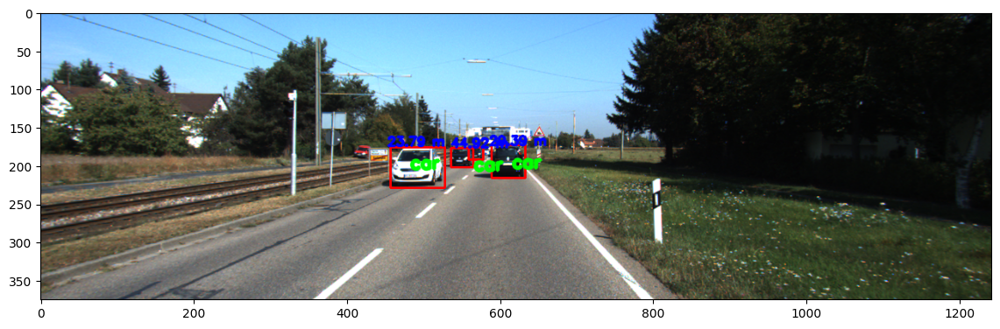

In [33]:
final_image, _ = build_fused_object(list_of_2d_objects, list_of_3d_objects, matches, lidar_2d )

plt.figure(figsize=(14,7))
plt.imshow(final_image)
plt.show()

## Create the Complete Pipeline

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA


# Extract features from bounding boxes
def extract_features(bboxes):
    features = []
    for box in bboxes:
        x1, y1, x2, y2 = box['bbox']
        width = x2 - x1
        height = y2 - y1
        aspect_ratio = width / height
        centroid_x = (x1 + x2) / 2
        centroid_y = (y1 + y2) / 2
     
        features.append([width, height, aspect_ratio, centroid_x, centroid_y])
    return features


def get_stuff(camera_bboxes,lidar_bboxes, matches):
    camera_features = extract_features(camera_bboxes)
    lidar_features = extract_features(lidar_bboxes)
    camera_final = []
    for c in matches:
        camera_final.append(camera_features[c[1]])
    lidar_final = []
    for c in matches:
        lidar_final.append(lidar_features[c[0]])
    print(camera_final,lidar_final, matches)
    return camera_final,lidar_final

def calculate_covariance(camera_features, lidar_features):
    difference_matrix = np.abs(np.array(camera_features) - np.array(lidar_features))
    covariance_matrix = np.cov(difference_matrix.T)
    pca = PCA()
    pca.fit(covariance_matrix)
    uncertainty_estimates_pca = pca.explained_variance_ratio_
    plt.bar(range(len(uncertainty_estimates_pca)), uncertainty_estimates_pca, color='skyblue', edgecolor='black')
    plt.xlabel('Principal Component (Dimension)')
    plt.ylabel('Variance Explained (Uncertainty)')
    plt.title('Uncertainty Estimates from PCA along Each Dimension')
    plt.show()
    return pca.components_[0]


# Extract features from both modalitie

In [35]:
cam=[]
lid=[]
def pipeline(img, calib_file):
    global c
    global l
    lidar2cam = LiDAR2Camera(calib_file)
    # 1 - Run Obstacle Detection
    result, pred_bboxes = run_obstacle_detection(image)

    # 2 - Build a 2D Object
    list_of_2d_objects = fill_2D_obstacles(result, pred_bboxes)

    # 3 - Build a 3D Object (from labels)
    list_of_3d_objects = read_label(label_files[index])

    # 4 - Get the LiDAR Boxes in the Image in 2D and 3D
    lidar_2d, lidar_3d =lidar2cam.get_image_with_bboxes(image, list_of_3d_objects)

    # 5 - Associate the LiDAR boxes and the Camera Boxes
    lidar_boxes = [obs.bbox2d for obs in list_of_3d_objects] # Simply get the boxes
    camera_boxes = [obs.bbox for obs in list_of_2d_objects]
    

    matches,iou_matrix = associate(lidar_boxes, camera_boxes)
    c = []

    for b in camera_boxes:
        c.append({'bbox': b})

    l = []
  
    for b in lidar_boxes:
        l.append({'bbox': b})

    
    camera_final,lidar_final = get_stuff(c,l,matches)
    
    for b in camera_final:
        cam.append(b)
    for b in lidar_final:
        lid.append(b)

    #6 - Build a Fused Object
    final_image, _ = build_fused_object(list_of_2d_objects, list_of_3d_objects, matches, lidar_2d)

    return final_image


There are 5 images

0: 224x640 5 cars, 1 truck, 255.7ms
Speed: 2.6ms preprocess, 255.7ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 640)
[[157.12369, 107.6165, 1.4600334, 407.70880126953125, 236.04583740234375], [225.14319, 155.84639, 1.444648, 906.3438720703125, 257.5112609863281], [111.214355, 90.38214, 1.2304903, 765.5382080078125, 228.97470092773438], [93.594696, 98.566925, 0.9495548, 493.56170654296875, 186.99632263183594], [52.776184, 40.166916, 1.3139217, 686.6094970703125, 202.589111328125]] [[154.2949648230167, 118.55342352352457, 1.3014804654072256, 412.87482625563547, 239.26076431871013], [241.9797600754365, 161.9065187582751, 1.494564653302873, 907.7389995925507, 260.25788331345245], [136.1210344601168, 99.11785820413462, 1.373325018583166, 781.1151558426936, 228.68138789315302], [93.29904750872333, 95.95022311605274, 0.9723692606308713, 493.06269500091923, 180.95965611368553], [51.59243347253437, 43.83516955332502, 1.1769643872318714, 687.060344816897, 200

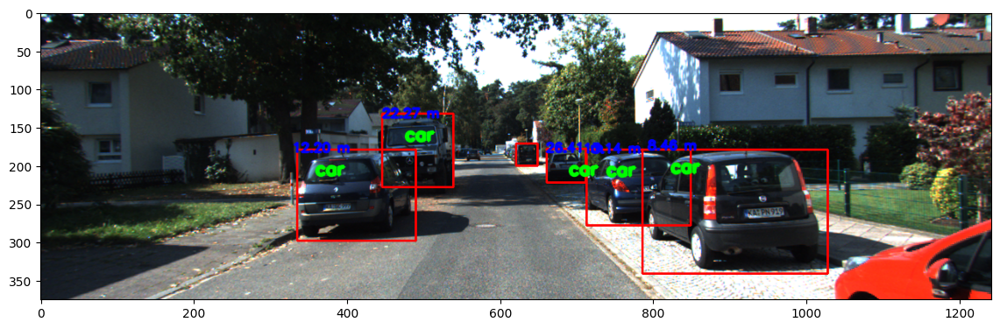


0: 224x640 3 cars, 246.4ms
Speed: 2.0ms preprocess, 246.4ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 640)
[[28.599182, 22.652756, 1.2625034, 598.9105224609375, 184.96676635742188], [107.14758, 81.29465, 1.3180152, 473.60357666015625, 216.23512268066406], [80.87993, 46.170425, 1.7517692, 273.75213623046875, 207.26605224609375]] [[26.848249199895804, 26.60732812936996, 1.0090546885938505, 600.6291074308608, 187.04426034135224], [103.31371449743949, 83.84984921065507, 1.232127612273763, 477.6966494749234, 218.65190690757362], [85.36090332223702, 46.719657099662186, 1.827087539194594, 277.85438753299985, 208.6490592652962]] [[0 1]
 [1 0]
 [2 2]]
index  1


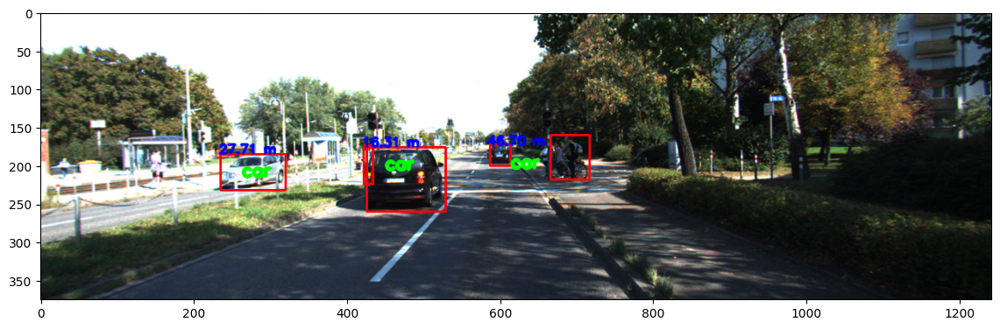


0: 224x640 1 car, 252.7ms
Speed: 2.7ms preprocess, 252.7ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 640)
[[65.81732, 58.011765, 1.1345513, 578.861328125, 206.578857421875]] [[62.66819770685254, 62.66006918689237, 1.0001297240821092, 582.6635652990801, 205.72262540130222]] [[1 0]]
index  2


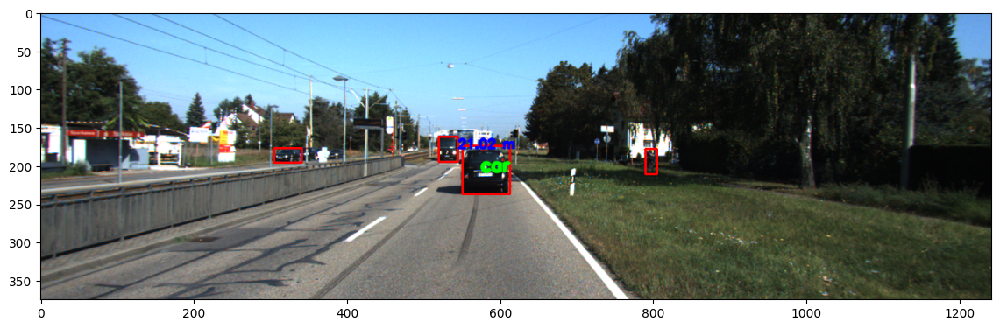


0: 224x640 3 cars, 247.7ms
Speed: 3.0ms preprocess, 247.7ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 640)
[[73.17816, 49.62979, 1.4744805, 490.1167297363281, 199.64227294921875], [25.667847, 23.701279, 1.0829731, 549.460205078125, 188.18502807617188], [46.234985, 41.688477, 1.1090591, 609.5280151367188, 193.974365234375]] [[70.81713118062828, 53.22334994725534, 1.3305650856402027, 493.4040804630842, 203.36151366079724], [29.21647021636261, 25.861602893081255, 1.1297238743148006, 550.7944493137275, 189.9396921259015], [43.33049965794714, 43.139890654269294, 1.0044183932964834, 611.6348272915889, 194.871826992036]] [[0 0]
 [1 2]
 [3 1]]
index  3


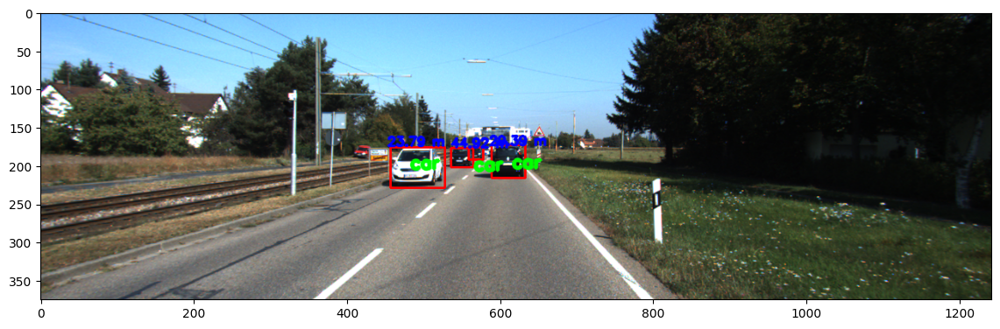


0: 224x640 2 cars, 246.6ms
Speed: 2.5ms preprocess, 246.6ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 640)
[[147.35577, 93.41637, 1.5774086, 410.57330322265625, 228.39578247070312]] [[155.51065510307302, 98.11704845772752, 1.5849503990132032, 412.31135709725277, 226.8335349427743]] [[0 0]]
index  4


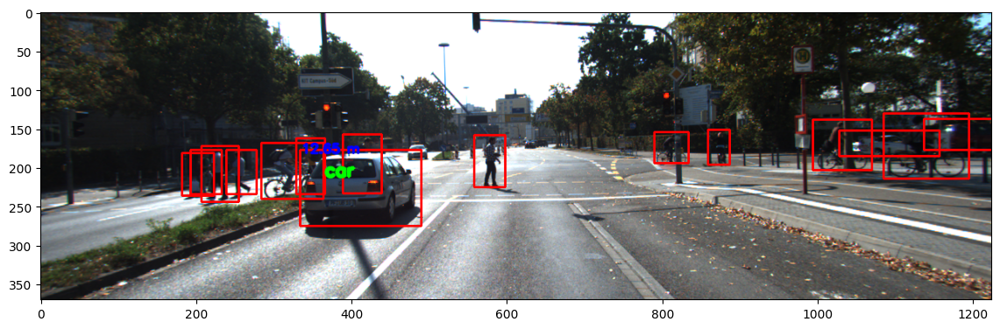

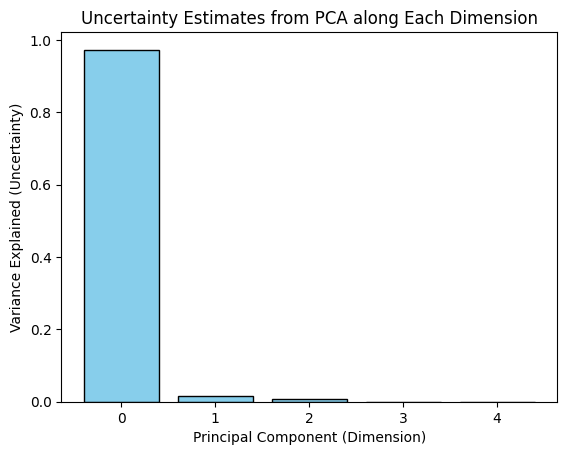

In [36]:
image_files = sorted(glob.glob("/kaggle/working/Camera-Lidar-Sensor-Fusion/data/img/*.png"))
point_files = sorted(glob.glob("/kaggle/working/Camera-Lidar-Sensor-Fusion/data/velodyne/*.pcd"))
label_files = sorted(glob.glob("/kaggle/working/Camera-Lidar-Sensor-Fusion/data/label/*.txt"))
calib_files = sorted(glob.glob("/kaggle/working/Camera-Lidar-Sensor-Fusion/data/calib/*.txt"))
print("There are",len(image_files),"images")



for index in range(0,5):
    image = cv2.cvtColor(cv2.imread(image_files[index]), cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(14,7))
    f=pipeline(image, calib_files[index])
    print("index ", index)
    plt.imshow(f)
    plt.show()

    
x = calculate_covariance(cam, lid)


In [37]:
print(x)

[    0.90111       0.167 -0.00048879     0.38806   -0.097619]


In [52]:
cam

[[157.12369, 107.6165, 1.4600334, 407.70880126953125, 236.04583740234375],
 [225.14319, 155.84639, 1.444648, 906.3438720703125, 257.5112609863281],
 [111.214355, 90.38214, 1.2304903, 765.5382080078125, 228.97470092773438],
 [93.594696, 98.566925, 0.9495548, 493.56170654296875, 186.99632263183594],
 [52.776184, 40.166916, 1.3139217, 686.6094970703125, 202.589111328125],
 [28.599182, 22.652756, 1.2625034, 598.9105224609375, 184.96676635742188],
 [107.14758, 81.29465, 1.3180152, 473.60357666015625, 216.23512268066406],
 [80.87993, 46.170425, 1.7517692, 273.75213623046875, 207.26605224609375],
 [65.81732, 58.011765, 1.1345513, 578.861328125, 206.578857421875],
 [73.17816, 49.62979, 1.4744805, 490.1167297363281, 199.64227294921875],
 [25.667847, 23.701279, 1.0829731, 549.460205078125, 188.18502807617188],
 [46.234985, 41.688477, 1.1090591, 609.5280151367188, 193.974365234375],
 [147.35577, 93.41637, 1.5774086, 410.57330322265625, 228.39578247070312]]

ValueError: 'c' argument has 150 elements, which is inconsistent with 'x' and 'y' with size 26.

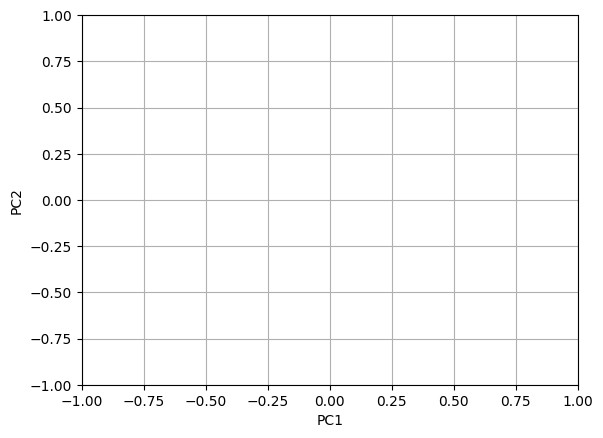

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.decomposition import PCA
import pandas as pd
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(final)
final=scaler.transform(final)    

pca = PCA()
x_new = pca.fit_transform(final)

def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley, c = y)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
plt.xlim(-1,1)
plt.ylim(-1,1)
plt.xlabel("PC{}".format(1))
plt.ylabel("PC{}".format(2))
plt.grid()

#Call the function. Use only the 2 PCs.
myplot(x_new[:,0:2],np.transpose(pca.components_[0:2, :]))
plt.show()

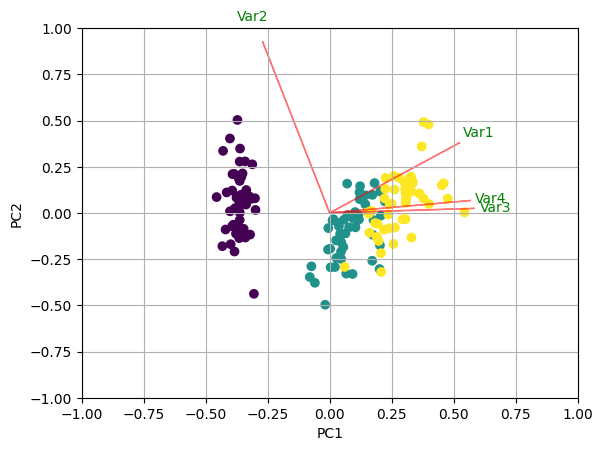

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.decomposition import PCA
import pandas as pd
from sklearn.preprocessing import StandardScaler

iris = datasets.load_iris()
X = iris.data
y = iris.target

#In general a good idea is to scale the data
scaler = StandardScaler()
scaler.fit(X)
X=scaler.transform(X)    

pca = PCA()
x_new = pca.fit_transform(X)

def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley, c = y)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
plt.xlim(-1,1)
plt.ylim(-1,1)
plt.xlabel("PC{}".format(1))
plt.ylabel("PC{}".format(2))
plt.grid()

#Call the function. Use only the 2 PCs.
myplot(x_new[:,0:2],np.transpose(pca.components_[0:2, :]))
plt.show()

In [43]:
X

array([[   -0.90068,       1.019,     -1.3402,     -1.3154],
       [     -1.143,    -0.13198,     -1.3402,     -1.3154],
       [    -1.3854,     0.32841,     -1.3971,     -1.3154],
       [    -1.5065,    0.098217,     -1.2834,     -1.3154],
       [    -1.0218,      1.2492,     -1.3402,     -1.3154],
       [   -0.53718,      1.9398,     -1.1697,     -1.0522],
       [    -1.5065,     0.78881,     -1.3402,     -1.1838],
       [    -1.0218,     0.78881,     -1.2834,     -1.3154],
       [    -1.7489,    -0.36218,     -1.3402,     -1.3154],
       [     -1.143,    0.098217,     -1.2834,     -1.4471],
       [   -0.53718,      1.4794,     -1.2834,     -1.3154],
       [    -1.2642,     0.78881,     -1.2266,     -1.3154],
       [    -1.2642,    -0.13198,     -1.3402,     -1.4471],
       [      -1.87,    -0.13198,     -1.5107,     -1.4471],
       [  -0.052506,        2.17,     -1.4539,     -1.3154],
       [   -0.17367,      3.0908,     -1.2834,     -1.0522],
       [   -0.53718,    

In [44]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])